<a href="https://colab.research.google.com/github/kellyrmat/ar_ivt/blob/main/Copy_of_Woooooo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# The ▯ Function: Two Perspectives
---
This document explores the mathematical properties of collapsing a 2D coordinate system into a 1D value while attempting to preserve structure. We define the **Tofu Function** (represented by the typographic missing-character block ▯) and its inverse mapping:

> **Forward:** ▯$(x, y) = Z$
> 
> **Inverse:** ▯$^{-1}(Z) = (x, y)$

## Perspective 1: The Discrete Lattice (Integer Mapping)

When the domain is constrained strictly to discrete integers ($x, y \in \mathbb{N}$), the function perfectly maps 2D space to 1D space without information loss. This is known mathematically as the Cantor Pairing Function.

<div align="center">
<br>
▯$(x, y) = \frac{1}{2}(x + y)(x + y + 1) + y$
<br><br>
</div>

**Behavior:** The function weaves through the integer coordinates in expanding diagonal sweeps. Because the plane is a discrete lattice, every unique integer $Z$ maps identically back to a single $(x, y)$ pair. Structural preservation is maintained specifically because the continuous gaps between points do not exist to cause topological tearing.


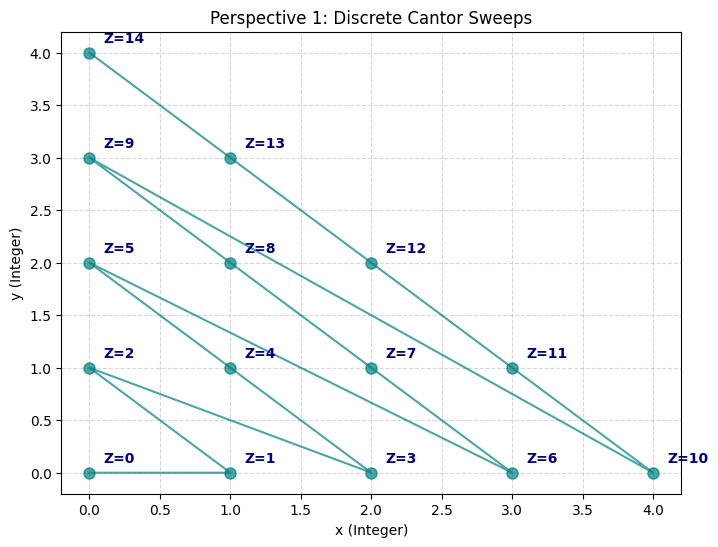


---
## Perspective 2: The Continuous Field (Log Isosurface)

If we lift the integer constraint and allow $x$ and $y$ to be any real numbers ($x, y \in \mathbb{R}$), the distinct diagonal path dissolves into a continuous scalar field spanning a curved parabolic landscape.

<div align="center">
<br>
$Z(x, y) = \frac{1}{2}(x + y)^2 + \frac{1}{2}(x + 3y)$
<br><br>
</div>

**Behavior:** In this continuous perspective, setting $Z = c$ (where $c$ is a specific constant output) no longer yields a distinct point. Instead, it forms an **isosurface**—a continuous level curve resembling skewed parabolic bands running along the $x + y$ gradient.

When viewed as a logarithmic height map ($\log(Z)$), this surface behaves like a potential well. Here, the strict bijection fails completely. You cannot apply ▯$^{-1}(Z)$ to retrieve a distinct $(x, y)$ coordinate because an infinitely dense curve of coordinates shares the exact same $Z$ value. This proves that collapsing continuous dimensions inherently destroys positional uniqueness.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import display, Markdown

# 1. Display the First Markdown Section
display(Markdown(r"""
# The ▯ Function: Two Perspectives
---
This document explores the mathematical properties of collapsing a 2D coordinate system into a 1D value while attempting to preserve structure. We define the **Tofu Function** (represented by the typographic missing-character block ▯) and its inverse mapping:

> **Forward:** ▯$(x, y) = Z$
>
> **Inverse:** ▯$^{-1}(Z) = (x, y)$

## Perspective 1: The Discrete Lattice (Integer Mapping)

When the domain is constrained strictly to discrete integers ($x, y \in \mathbb{N}$), the function perfectly maps 2D space to 1D space without information loss. This is known mathematically as the Cantor Pairing Function.

<div align="center">
<br>
▯$(x, y) = \frac{1}{2}(x + y)(x + y + 1) + y$
<br><br>
</div>

**Behavior:** The function weaves through the integer coordinates in expanding diagonal sweeps. Because the plane is a discrete lattice, every unique integer $Z$ maps identically back to a single $(x, y)$ pair. Structural preservation is maintained specifically because the continuous gaps between points do not exist to cause topological tearing.
"""))

# 2. Generate the Discrete Sweep Plot (Standard 2D Matplotlib)
def cantor_pairing(x, y):
    return 0.5 * (x + y) * (x + y + 1) + y

points = [(x, y) for s in range(5) for x in range(s, -1, -1) for y in range(s+1) if x + y == s]
x_vals, y_vals = zip(*points)
z_vals = [cantor_pairing(x, y) for x, y in points]

plt.figure(figsize=(8, 6))
plt.plot(x_vals, y_vals, marker='o', linestyle='-', color='teal', markersize=8, alpha=0.7)

for i, (x, y) in enumerate(points):
    plt.text(x + 0.1, y + 0.1, f'Z={int(z_vals[i])}', fontsize=10, color='navy', fontweight='bold')

plt.title('Perspective 1: Discrete Cantor Sweeps')
plt.xlabel('x (Integer)')
plt.ylabel('y (Integer)')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# 3. Display the Second Markdown Section
display(Markdown(r"""
---
## Perspective 2: The Continuous Field (Log Isosurface)

If we lift the integer constraint and allow $x$ and $y$ to be any real numbers ($x, y \in \mathbb{R}$), the distinct diagonal path dissolves into a continuous scalar field spanning a curved parabolic landscape.

<div align="center">
<br>
$Z(x, y) = \frac{1}{2}(x + y)^2 + \frac{1}{2}(x + 3y)$
<br><br>
</div>

**Behavior:** In this continuous perspective, setting $Z = c$ (where $c$ is a specific constant output) no longer yields a distinct point. Instead, it forms an **isosurface**—a continuous level curve resembling skewed parabolic bands running along the $x + y$ gradient.

When viewed as a logarithmic height map ($\log(Z)$), this surface behaves like a potential well. Here, the strict bijection fails completely. You cannot apply ▯$^{-1}(Z)$ to retrieve a distinct $(x, y)$ coordinate because an infinitely dense curve of coordinates shares the exact same $Z$ value. This proves that collapsing continuous dimensions inherently destroys positional uniqueness.
"""))

# 4. Generate the Continuous Isosurface Plot (Interactive 3D Plotly)
x_cont = np.linspace(0, 5, 100)
y_cont = np.linspace(0, 5, 100)
X, Y = np.meshgrid(x_cont, y_cont)

# Calculate Z based on the continuous Tofu function
Z = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)

# Create the 3D surface plot using Plotly
fig = go.Figure(data=[go.Surface(z=Z, x=x_cont, y=y_cont, colorscale='Viridis')])

# Update layout for better viewing
fig.update_layout(
    title='Perspective 2: Continuous Scalar Field (Interactive 3D)',
    scene=dict(
        xaxis_title='x (Real)',
        yaxis_title='y (Real)',
        zaxis_title='Z(x, y)'
    ),
    width=800,
    height=600,
    margin=dict(l=65, r=50, b=65, t=90)
)

fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Define the spatial grid (the "pond")
# We use 0 to 2.5 to capture the growing intensity of the Cantor function
x = np.linspace(0, 2.5, 120)
y = np.linspace(0, 2.5, 120)
X, Y = np.meshgrid(x, y)

# Calculate the distance from the origin (radius)
R = np.sqrt(X**2 + Y**2)

# 2. The Normal Universe (Constant Pi)
# A standard ripple propagating outward symmetrically
Z_normal = np.sin(np.pi * R)

# 3. The Corrupted Universe (Cantor Substitution)
# Replace pi with the continuous Cantor function mapping
C = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)
Z_corrupted = np.sin(C * R)

# 4. Create a side-by-side interactive 3D plot
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'surface'}, {'type': 'surface'}]],
    subplot_titles=('Normal Fluid Ripple (Constant Pi)', 'Corrupted Ripple (Cantor Function)')
)

# Add the normal wave
fig.add_trace(
    go.Surface(z=Z_normal, x=x, y=y, colorscale='Blues', showscale=False),
    row=1, col=1
)

# Add the corrupted Cantor wave
fig.add_trace(
    go.Surface(z=Z_corrupted, x=x, y=y, colorscale='Viridis', showscale=False),
    row=1, col=2
)

# Tweak the layout for optimal viewing
fig.update_layout(
    title_text='Dynamical Systems: The Pi Substitution Experiment',
    width=950,
    height=600,
    margin=dict(l=10, r=10, b=10, t=60),
    scene=dict(zaxis=dict(range=[-1.5, 1.5])),
    scene2=dict(zaxis=dict(range=[-1.5, 1.5]))
)

fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go

# 1. Define the spatial grid
x = np.linspace(0, 2.5, 85)
y = np.linspace(0, 2.5, 85)
X, Y = np.meshgrid(x, y)

# Radius (Distance from origin) and the Cantor Function
R = np.sqrt(X**2 + Y**2)
C = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)

# 2. Define the parameter slider (alpha from 0 to 1)
num_steps = 21
alphas = np.linspace(0, 1, num_steps)

fig = go.Figure()

# 3. Pre-compute every state of the universe and add as a hidden layer
for i, alpha in enumerate(alphas):
    # The interpolation magic happens here
    M = (1 - alpha) * np.pi + alpha * C
    Z = np.sin(M * R)

    # Add the surface, but only make the first one (alpha=0) visible initially
    fig.add_trace(
        go.Surface(
            z=Z, x=x, y=y,
            colorscale='Viridis',
            cmin=-1, cmax=1, # Lock the color scale so it doesn't flash
            visible=(i == 0),
            name=f"α={alpha:.2f}"
        )
    )

# 4. Build the slider UI mechanics
steps = []
for i, alpha in enumerate(alphas):
    # Create an array of False, then set the current index to True
    visible_array = [False] * num_steps
    visible_array[i] = True

    step = dict(
        method="update",
        args=[{"visible": visible_array}],
        label=f"{alpha:.2f}"
    )
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Cantor Influence (α): "},
    pad={"t": 50},
    steps=steps
)]

# 5. Finalize the layout and render
fig.update_layout(
    sliders=sliders,
    title="Parameterizing the Physics: Normal π ➔ Cantor Function",
    width=900,
    height=700,
    scene=dict(
        zaxis=dict(range=[-1.5, 1.5]),
        xaxis_title="x (Real)",
        yaxis_title="y (Real)",
        zaxis_title="Wave Amplitude"
    )
)

fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go

# 1. Define the spatial grid (90x90 to push the resolution)
x = np.linspace(0, 2.5, 90)
y = np.linspace(0, 2.5, 90)
X, Y = np.meshgrid(x, y)

# Radius and the fully Corrupted Cantor Function
R = np.sqrt(X**2 + Y**2)
C = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)

# 2. Define the Time steps (simulating one continuous flow of time)
num_frames = 30
times = np.linspace(0, 2 * np.pi, num_frames)

fig = go.Figure()

# 3. Pre-compute every tick of the clock
for i, t in enumerate(times):
    # The wave travels forward by subtracting time (multiplied by 3 for a faster visual speed)
    Z = np.sin(C * R - t * 3)

    # Add the surface to the figure
    fig.add_trace(
        go.Surface(
            z=Z, x=x, y=y,
            colorscale='Magma', # Changed to Magma for a "boiling" aesthetic
            cmin=-1, cmax=1,
            visible=(i == 0),
            name=f"t={t:.2f}"
        )
    )

# 4. Build the Time Slider UI
steps = []
for i, t in enumerate(times):
    visible_array = [False] * num_frames
    visible_array[i] = True

    step = dict(
        method="update",
        args=[{"visible": visible_array}],
        label=f"{t:.2f}"
    )
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Time (t): "},
    pad={"t": 50},
    steps=steps
)]

# 5. Finalize layout and render
fig.update_layout(
    sliders=sliders,
    title="Time Evolution of a Topologically Torn Wave",
    width=900,
    height=700,
    scene=dict(
        zaxis=dict(range=[-1.5, 1.5]),
        xaxis_title="x (Real)",
        yaxis_title="y (Real)",
        zaxis_title="Wave Amplitude"
    )
)

fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Define the 3D spatial volume (The "3D Pond")
# We keep the grid small (0.01 to 1.1) to prevent the quartic math from causing a buffer overflow
res = 40
x = np.linspace(0.01, 1.1, res)
y = np.linspace(0.01, 1.1, res)
z = np.linspace(0.01, 1.1, res)
X, Y, Z_grid = np.meshgrid(x, y, z, indexing='ij')

# Radius from origin in 3D
R = np.sqrt(X**2 + Y**2 + Z_grid**2)

# 2. Normal 3D Wave (Isotropic Constant Pi)
# We multiply by 5 to generate a few distinct shells
W_normal = np.sin(np.pi * R * 5)

# 3. Corrupted 3D Wave (Nested Cantor Function)
# First collapse X and Y, then collapse the result with Z
C2 = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)
C3 = 0.5 * (C2 + Z_grid)**2 + 0.5 * (C2 + 3*Z_grid)
W_corrupt = np.sin(C3 * R)

# 4. Set up side-by-side 3D renderers
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scene'}, {'type': 'scene'}]],
    subplot_titles=('Normal Universe (Spherical Shells)', 'Cantor Universe (Topological Tearing)')
)

# 5. Add the Normal Isosurface
# We normalize the view by only drawing the surface where the wave is at its peak (0.6 to 1.0)
fig.add_trace(
    go.Isosurface(
        x=X.flatten(), y=Y.flatten(), z=Z_grid.flatten(),
        value=W_normal.flatten(),
        isomin=0.6, isomax=1.0,
        surface_count=2,
        colorscale='Blues',
        caps=dict(x_show=False, y_show=False, z_show=False),
        opacity=0.5
    ),
    row=1, col=1
)

# 6. Add the Corrupted Cantor Isosurface
fig.add_trace(
    go.Isosurface(
        x=X.flatten(), y=Y.flatten(), z=Z_grid.flatten(),
        value=W_corrupt.flatten(),
        isomin=0.6, isomax=1.0,
        surface_count=2,
        colorscale='Viridis',
        caps=dict(x_show=False, y_show=False, z_show=False),
        opacity=0.5
    ),
    row=1, col=2
)

# Tweak the layout
fig.update_layout(
    title_text='3D Normalized Isosurfaces: The Nested Blow-Up',
    width=950,
    height=600,
    margin=dict(l=10, r=10, b=10, t=60)
)

fig.show()

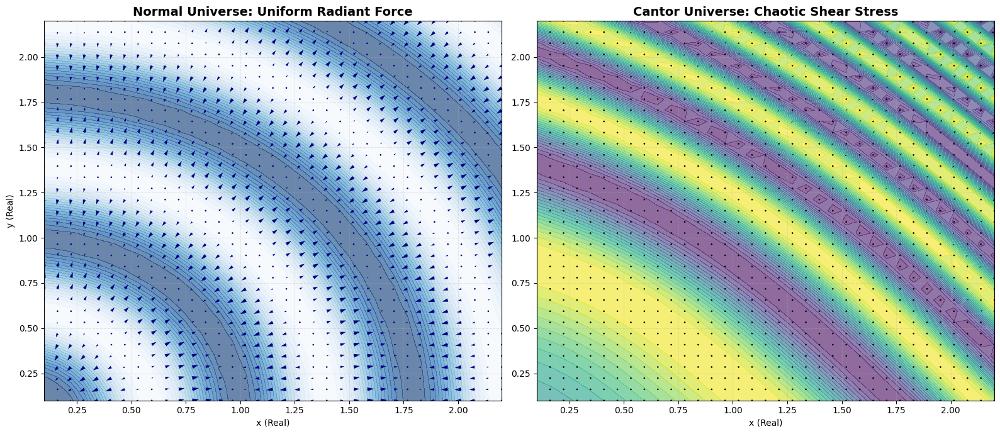

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Define a slightly lower-res grid so the arrows don't overlap too much
x = np.linspace(0.1, 2.2, 35)
y = np.linspace(0.1, 2.2, 35)
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)

# 2. Normal Wave (Isotropic Pi)
Z_normal = np.sin(np.pi * R * 2.5)
# np.gradient calculates the partial derivatives (dy, dx)
dZy_norm, dZx_norm = np.gradient(Z_normal)

# 3. Corrupted Wave (Cantor Function)
C = 0.5 * (X + Y)**2 + 0.5 * (X + 3*Y)
Z_cantor = np.sin(C * R)
dZy_cant, dZx_cant = np.gradient(Z_cantor)

# 4. Set up the side-by-side plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))

# Plot 1: Normal Universe
# Draw the wave as a background heatmap
ax1.contourf(X, Y, Z_normal, levels=20, cmap='Blues', alpha=0.6)
# Overlay the force vectors (arrows)
ax1.quiver(X, Y, dZx_norm, dZy_norm, color='navy', angles='xy', scale_units='xy', scale=15, width=0.004)
ax1.set_title('Normal Universe: Uniform Radiant Force', fontsize=14, fontweight='bold')
ax1.set_xlabel('x (Real)')
ax1.set_ylabel('y (Real)')
ax1.grid(True, linestyle='--', alpha=0.3)

# Plot 2: Cantor Universe
ax2.contourf(X, Y, Z_cantor, levels=20, cmap='viridis', alpha=0.6)
ax2.quiver(X, Y, dZx_cant, dZy_cant, color='black', angles='xy', scale_units='xy', scale=100, width=0.004)
ax2.set_title('Cantor Universe: Chaotic Shear Stress', fontsize=14, fontweight='bold')
ax2.set_xlabel('x (Real)')
ax2.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()

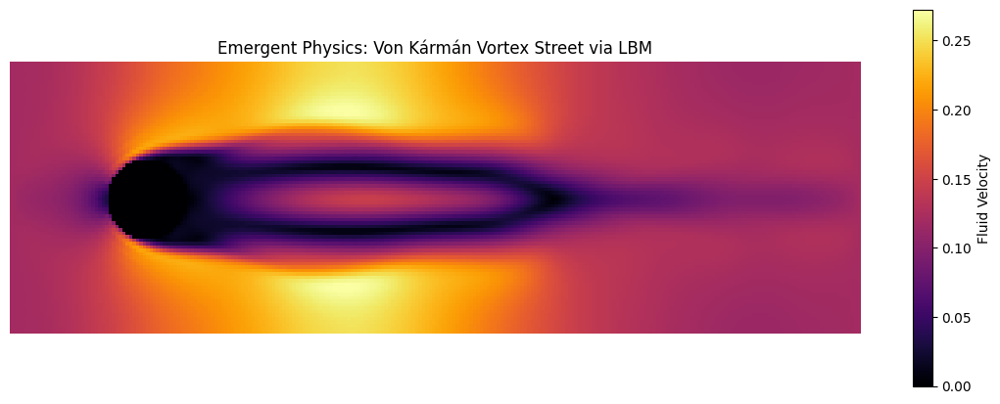

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Simulation Parameters
width, height = 250, 80
iters = 2500
tau = 0.53                  # Collision relaxation time (viscosity)

# 2. D2Q9 Lattice Vectors & Weights (9 discrete directions)
idxs = np.arange(9)
cxs = np.array([0, 1, 0, -1, 0, 1, -1, -1, 1])
cys = np.array([0, 0, 1, 0, -1, 1, 1, -1, -1])
weights = np.array([4/9, 1/9, 1/9, 1/9, 1/9, 1/36, 1/36, 1/36, 1/36])
opp = [0, 3, 4, 1, 2, 7, 8, 5, 6] # Indices for bouncing backwards

# 3. Obstacle Creation (A solid cylinder in the channel)
obstacle = np.full((height, width), False)
for y in range(height):
    for x in range(width):
        if (x - 40)**2 + (y - height//2)**2 < 12**2:
            obstacle[y, x] = True

# 4. Initialize Fluid Probabilities
F = np.ones((height, width, 9))
for i, cx, cy, w in zip(idxs, cxs, cys, weights):
    F[:, :, i] *= w * (1 + 3 * (cx * 0.12)) # Push fluid right

# 5. The Main Physics Engine Loop
for it in range(iters):
    # A. Calculate Macroscopic Variables
    rho = np.sum(F, axis=2)
    ux = np.sum(F * cxs, axis=2) / rho
    uy = np.sum(F * cys, axis=2) / rho

    # Force inflow velocity and zero velocity inside the obstacle
    ux[:, 0] = 0.12
    uy[:, 0] = 0.0
    ux[obstacle] = 0
    uy[obstacle] = 0

    # B. Collision Step (Calculate Equilibrium & Relax)
    Feq = np.zeros(F.shape)
    for i, cx, cy, w in zip(idxs, cxs, cys, weights):
        cu = 3 * (cx * ux + cy * uy)
        u2 = 1.5 * (ux**2 + uy**2)
        Feq[:, :, i] = rho * w * (1 + cu + 0.5 * cu**2 - u2)

    F += -(1.0 / tau) * (F - Feq)

    # C. Boundary Conditions (Bounce-Back) - FIXED
    bounced = F[obstacle, :]
    F[obstacle, :] = bounced[:, opp]

    # D. Streaming Step (Move probabilities to adjacent nodes)
    for i, cx, cy in zip(idxs, cxs, cys):
        F[:, :, i] = np.roll(F[:, :, i], cx, axis=1)
        F[:, :, i] = np.roll(F[:, :, i], cy, axis=0)

# 6. Visualization
velocity_magnitude = np.sqrt(ux**2 + uy**2)
velocity_magnitude[obstacle] = 0

plt.figure(figsize=(14, 5))
plt.imshow(velocity_magnitude, cmap='inferno')
plt.colorbar(label='Fluid Velocity')
plt.title('Emergent Physics: Von Kármán Vortex Street via LBM')
plt.axis('off')
plt.show()

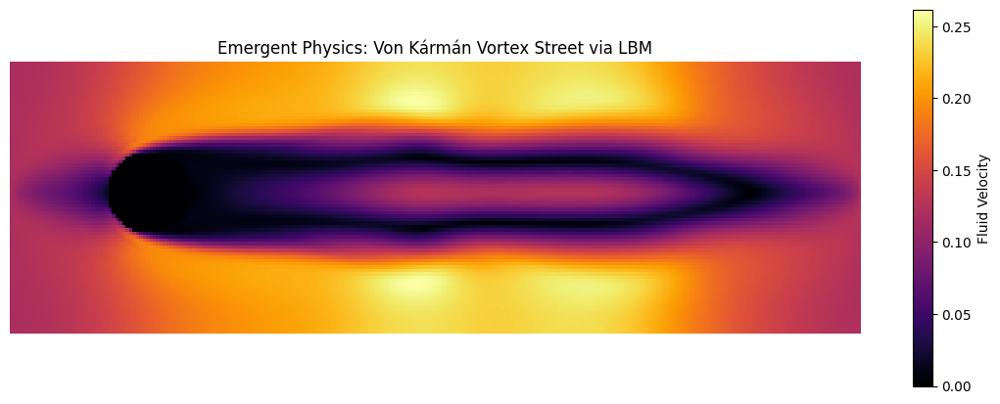

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Simulation Parameters
width, height = 250, 80
iters = 4000                # Increased to let the vortex street fully develop
tau = 0.53                  # Collision relaxation time (viscosity)

# 2. D2Q9 Lattice Vectors & Weights (9 discrete directions)
idxs = np.arange(9)
cxs = np.array([0, 1, 0, -1, 0, 1, -1, -1, 1])
cys = np.array([0, 0, 1, 0, -1, 1, 1, -1, -1])
weights = np.array([4/9, 1/9, 1/9, 1/9, 1/9, 1/36, 1/36, 1/36, 1/36])
opp = [0, 3, 4, 1, 2, 7, 8, 5, 6] # Indices for bouncing backwards

# 3. Obstacle Creation (Shifted off-center to break perfect symmetry)
obstacle = np.full((height, width), False)
for y in range(height):
    for x in range(width):
        # Center is at y=38 instead of 40 to trigger the instability!
        if (x - 40)**2 + (y - 38)**2 < 12**2:
            obstacle[y, x] = True

# 4. Initialize Fluid Probabilities
F = np.ones((height, width, 9))
for i, cx, cy, w in zip(idxs, cxs, cys, weights):
    F[:, :, i] *= w * (1 + 3 * (cx * 0.12)) # Push fluid right

# 5. The Main Physics Engine Loop
for it in range(iters):
    # A. Calculate Macroscopic Variables
    rho = np.sum(F, axis=2)
    ux = np.sum(F * cxs, axis=2) / rho
    uy = np.sum(F * cys, axis=2) / rho

    # Force inflow velocity and zero velocity inside the obstacle
    ux[:, 0] = 0.12
    uy[:, 0] = 0.0
    ux[obstacle] = 0
    uy[obstacle] = 0

    # B. Collision Step (Calculate Equilibrium & Relax)
    Feq = np.zeros(F.shape)
    for i, cx, cy, w in zip(idxs, cxs, cys, weights):
        cu = 3 * (cx * ux + cy * uy)
        u2 = 1.5 * (ux**2 + uy**2)
        Feq[:, :, i] = rho * w * (1 + cu + 0.5 * cu**2 - u2)

    F += -(1.0 / tau) * (F - Feq)

    # C. Boundary Conditions (Bounce-Back) - FIXED
    bounced = F[obstacle, :]
    F[obstacle, :] = bounced[:, opp]

    # D. Streaming Step (Move probabilities to adjacent nodes)
    for i, cx, cy in zip(idxs, cxs, cys):
        F[:, :, i] = np.roll(F[:, :, i], cx, axis=1)
        F[:, :, i] = np.roll(F[:, :, i], cy, axis=0)

# 6. Visualization
velocity_magnitude = np.sqrt(ux**2 + uy**2)
velocity_magnitude[obstacle] = 0

plt.figure(figsize=(14, 5))
plt.imshow(velocity_magnitude, cmap='inferno')
plt.colorbar(label='Fluid Velocity')
plt.title('Emergent Physics: Von Kármán Vortex Street via LBM')
plt.axis('off')
plt.show()

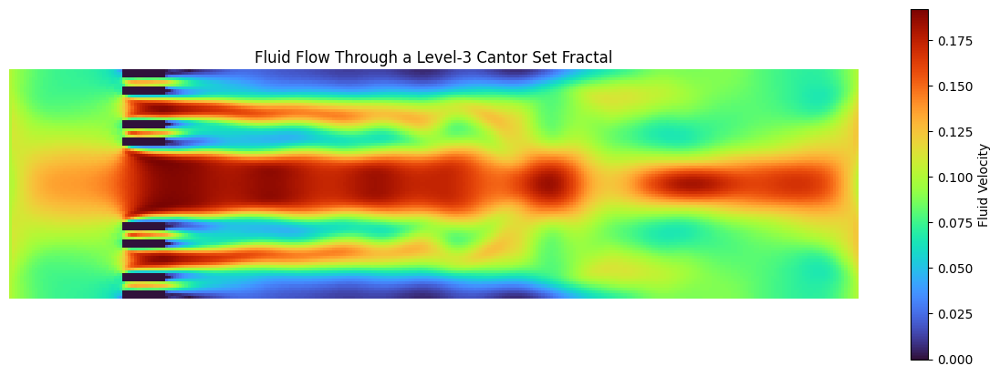

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Simulation Parameters (Height changed to 81 for base-3 fractal math)
width, height = 300, 81
iters = 2500
tau = 0.53

# 2. D2Q9 Lattice Vectors & Weights
idxs = np.arange(9)
cxs = np.array([0, 1, 0, -1, 0, 1, -1, -1, 1])
cys = np.array([0, 0, 1, 0, -1, 1, 1, -1, -1])
weights = np.array([4/9, 1/9, 1/9, 1/9, 1/9, 1/36, 1/36, 1/36, 1/36])
opp = [0, 3, 4, 1, 2, 7, 8, 5, 6]

# 3. Obstacle Creation: The Cantor Grating
obstacle = np.full((height, width), False)

# First, build a solid wall
obstacle[:, 40:55] = True

# Next, recursively carve out the Cantor Set holes
def carve_cantor(y_start, y_end, depth):
    if depth == 0:
        return
    length = y_end - y_start
    third = length // 3

    # Erase the middle third to let fluid pass through
    obstacle[y_start + third : y_end - third, 40:55] = False

    # Recurse on the remaining top and bottom segments
    carve_cantor(y_start, y_start + third, depth - 1)
    carve_cantor(y_end - third, y_end, depth - 1)

# Apply 3 levels of fractal depth to the wall
carve_cantor(0, 81, 3)

# 4. Initialize Fluid Probabilities
F = np.ones((height, width, 9))
for i, cx, cy, w in zip(idxs, cxs, cys, weights):
    F[:, :, i] *= w * (1 + 3 * (cx * 0.10))

# 5. The Main Physics Engine Loop
for it in range(iters):
    # A. Calculate Macroscopic Variables
    rho = np.sum(F, axis=2)
    ux = np.sum(F * cxs, axis=2) / rho
    uy = np.sum(F * cys, axis=2) / rho

    # Force inflow velocity
    ux[:, 0] = 0.10
    uy[:, 0] = 0.0
    ux[obstacle] = 0
    uy[obstacle] = 0

    # B. Collision Step
    Feq = np.zeros(F.shape)
    for i, cx, cy, w in zip(idxs, cxs, cys, weights):
        cu = 3 * (cx * ux + cy * uy)
        u2 = 1.5 * (ux**2 + uy**2)
        Feq[:, :, i] = rho * w * (1 + cu + 0.5 * cu**2 - u2)

    F += -(1.0 / tau) * (F - Feq)

    # C. Boundary Conditions (Bounce-Back off the fractal)
    bounced = F[obstacle, :]
    F[obstacle, :] = bounced[:, opp]

    # D. Streaming Step
    for i, cx, cy in zip(idxs, cxs, cys):
        F[:, :, i] = np.roll(F[:, :, i], cx, axis=1)
        F[:, :, i] = np.roll(F[:, :, i], cy, axis=0)

# 6. Visualization
velocity_magnitude = np.sqrt(ux**2 + uy**2)
velocity_magnitude[obstacle] = 0

plt.figure(figsize=(15, 5))
plt.imshow(velocity_magnitude, cmap='turbo')
plt.colorbar(label='Fluid Velocity')
plt.title('Fluid Flow Through a Level-3 Cantor Set Fractal')
plt.axis('off')
plt.show()

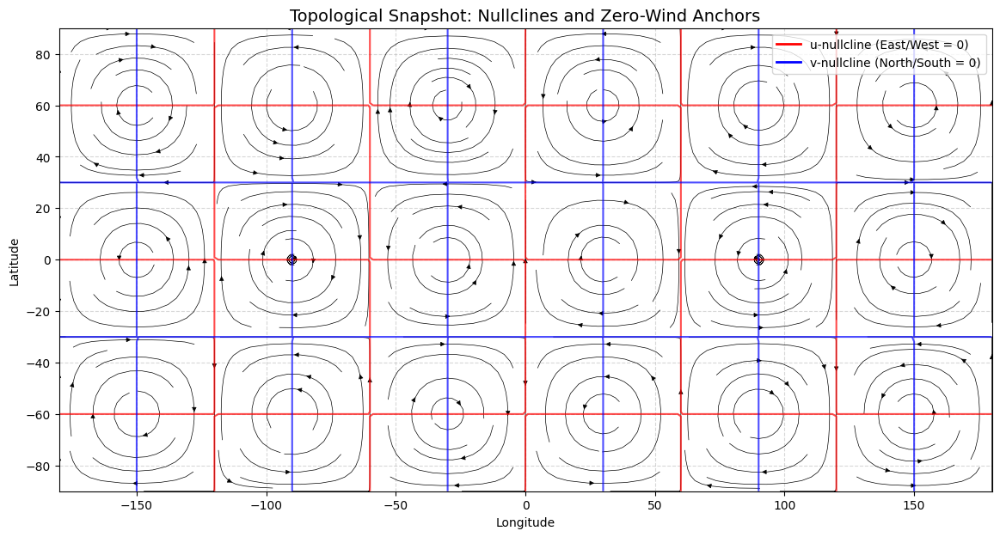

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Create the Spherical Grid (Latitude and Longitude)
lon = np.linspace(-180, 180, 200)
lat = np.linspace(-90, 90, 100)
Lon, Lat = np.meshgrid(lon, lat)

# Convert to radians for the math
phi = np.radians(Lon)
theta = np.radians(Lat)

# 2. Define the Streamfunction (Spherical Harmonic Approximation)
# We use a wave number of 3 to simulate planetary Rossby waves
psi = np.sin(3 * phi) * np.cos(3 * theta)

# 3. Derive the Wind Field from the Streamfunction
# u is the negative latitudinal gradient, v is the longitudinal gradient
du_dlat, du_dlon = np.gradient(psi)
u = -du_dlat
v = du_dlon

# 4. Visualization: Mapping the Topology
plt.figure(figsize=(14, 7))

# Draw the wind vectors (The Flow)
plt.streamplot(lon, lat, u, v, density=1.5, color='black', linewidth=0.5, arrowsize=0.8)

# Draw the Nullclines (The Math)
# Red lines: East-West wind is exactly zero
plt.contour(Lon, Lat, u, levels=[0], colors='red', linewidths=1.5, alpha=0.7)
# Blue lines: North-South wind is exactly zero
plt.contour(Lon, Lat, v, levels=[0], colors='blue', linewidths=1.5, alpha=0.7)

# Formatting
plt.title('Topological Snapshot: Nullclines and Zero-Wind Anchors', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-180, 180)
plt.ylim(-90, 90)
plt.grid(True, linestyle='--', alpha=0.5)

# Custom legend
from matplotlib.lines import Line2D
custom_lines = [Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='blue', lw=2)]
plt.legend(custom_lines, ['u-nullcline (East/West = 0)', 'v-nullcline (North/South = 0)'], loc='upper right')

plt.show()

In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np

# 1. NASA GES DISC OPeNDAP URL for MERRA-2
# This targets the 3D instantaneous assimilated state (inst3_3d_asm_Np)
# Using today's date: August 29, 2026
date_str = "20260829"
url = f"https://goldsmr5.gesdisc.eosdis.nasa.gov/opendap/MERRA2/M2I3NPASM.5.12.4/2026/08/MERRA2_400.inst3_3d_asm_Np.{date_str}.nc4"

print("Connecting to NASA MERRA-2 OPeNDAP server...")

try:
    # 2. Open the dataset lazily (does not download the whole file)
    ds = xr.open_dataset(url)

    # 3. Slice the data: Get U and V wind at 250 hPa (jet stream level) for the first time step
    # MERRA-2 pressure levels are usually represented in hPa
    wind_data = ds[['U', 'V']].sel(lev=250.0, time=ds.time[0])

    # 4. Load the sliced data into memory
    u_real = wind_data['U'].values
    v_real = wind_data['V'].values
    lon_real = wind_data['lon'].values
    lat_real = wind_data['lat'].values

    Lon_r, Lat_r = np.meshgrid(lon_real, lat_real)

    # 5. Plot the Real-World Nullclines
    plt.figure(figsize=(14, 7))

    # We use quiver instead of streamplot here for raw data speed, subsampling every 4th grid point
    skip = (slice(None, None, 4), slice(None, None, 4))
    plt.quiver(Lon_r[skip], Lat_r[skip], u_real[skip], v_real[skip],
               color='gray', alpha=0.5, scale=1000)

    # The real-world topological anchors
    plt.contour(Lon_r, Lat_r, u_real, levels=[0], colors='red', linewidths=1.2, alpha=0.8)
    plt.contour(Lon_r, Lat_r, v_real, levels=[0], colors='blue', linewidths=1.2, alpha=0.8)

    plt.title(f'MERRA-2 Real-World Topology (250 hPa) - {date_str}', fontsize=14)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.xlim(-180, 180)
    plt.ylim(-90, 90)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()

except Exception as e:
    print(f"Connection or processing failed. Ensure your Earthdata .netrc is configured.\nError: {e}")

Connecting to NASA MERRA-2 OPeNDAP server...
Connection or processing failed. Ensure your Earthdata .netrc is configured.
Error: https://goldsmr5.gesdisc.eosdis.nasa.gov/opendap/MERRA2/M2I3NPASM.5.12.4/2026/08/MERRA2_400.inst3_3d_asm_Np.20260829.nc4


In [ ]:
!pip install netcdf4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 30.3 MB/s eta 0:00:00


In [ ]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# NOAA PSL OPeNDAP URLs
url_u = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.mean.nc"
url_v = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.mean.nc"

print("Connecting to NOAA NCEP Reanalysis OPeNDAP server via OPeNDAP engine...")

# Explicitly pass engine='netcdf4' to handle the OPeNDAP stream correctly
ds_u = xr.open_dataset(url_u, engine='netcdf4')
ds_v = xr.open_dataset(url_v, engine='netcdf4')

# Slice the data: Get U and V wind at 250 hPa (jet stream level) for January (time index 0)
u_data = ds_u['uwnd'].sel(level=250.0).isel(time=0)
v_data = ds_v['vwnd'].sel(level=250.0).isel(time=0)

u_real = u_data.values
v_real = v_data.values
lon_real = u_data['lon'].values
lat_real = u_data['lat'].values

Lon_r, Lat_r = np.meshgrid(lon_real, lat_real)

# Visualization: Plot the Real-World Nullclines
plt.figure(figsize=(14, 7))

# Quiver plot for the raw wind vectors (subsampled for visual clarity)
skip = (slice(None, None, 2), slice(None, None, 2))
plt.quiver(Lon_r[skip], Lat_r[skip], u_real[skip], v_real[skip],
           color='gray', alpha=0.5, scale=800)

# The real-world topological anchors (Nullclines)
plt.contour(Lon_r, Lat_r, u_real, levels=[0], colors='red', linewidths=1.5, alpha=0.8)
plt.contour(Lon_r, Lat_r, v_real, levels=[0], colors='blue', linewidths=1.5, alpha=0.8)

# Formatting
plt.title('NOAA NCEP Real-World Topology (250 hPa) - Climatological Mean', fontsize=14)
plt.xlabel('Longitude (0 to 360)')
plt.ylabel('Latitude')
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.grid(True, linestyle='--', alpha=0.5)

# Custom legend
custom_lines = [Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='blue', lw=2)]
plt.legend(custom_lines, ['u-nullcline (East/West = 0)', 'v-nullcline (North/South = 0)'], loc='upper right')

plt.show()

Connecting to NOAA NCEP Reanalysis OPeNDAP server via OPeNDAP engine...


ValueError: unrecognized engine 'netcdf4' must be one of your download engines: ['h5netcdf', 'scipy', 'store']. To install additional dependencies, see:
https://docs.xarray.dev/en/stable/user-guide/io.html 
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html

In [ ]:
# 1. Install the engine FIRST
!pip install netCDF4

# 2. Import the libraries only AFTER the installation finishes
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# 3. NOAA PSL OPeNDAP URLs
url_u = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.mean.nc"
url_v = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.mean.nc"

print("Connecting to NOAA NCEP Reanalysis OPeNDAP server via OPeNDAP engine...")

# Explicitly pass engine='netcdf4'
ds_u = xr.open_dataset(url_u, engine='netcdf4')
ds_v = xr.open_dataset(url_v, engine='netcdf4')

# Slice the data: Get U and V wind at 250 hPa (jet stream level) for January (time index 0)
u_data = ds_u['uwnd'].sel(level=250.0).isel(time=0)
v_data = ds_v['vwnd'].sel(level=250.0).isel(time=0)

u_real = u_data.values
v_real = v_data.values
lon_real = u_data['lon'].values
lat_real = u_data['lat'].values

Lon_r, Lat_r = np.meshgrid(lon_real, lat_real)

# 4. Visualization
plt.figure(figsize=(14, 7))

skip = (slice(None, None, 2), slice(None, None, 2))
plt.quiver(Lon_r[skip], Lat_r[skip], u_real[skip], v_real[skip],
           color='gray', alpha=0.5, scale=800)

plt.contour(Lon_r, Lat_r, u_real, levels=[0], colors='red', linewidths=1.5, alpha=0.8)
plt.contour(Lon_r, Lat_r, v_real, levels=[0], colors='blue', linewidths=1.5, alpha=0.8)

plt.title('NOAA NCEP Real-World Topology (250 hPa) - Climatological Mean', fontsize=14)
plt.xlabel('Longitude (0 to 360)')
plt.ylabel('Latitude')
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.grid(True, linestyle='--', alpha=0.5)

custom_lines = [Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='blue', lw=2)]
plt.legend(custom_lines, ['u-nullcline (East/West = 0)', 'v-nullcline (North/South = 0)'], loc='upper right')

plt.show()

Connecting to NOAA NCEP Reanalysis OPeNDAP server via OPeNDAP engine...


ValueError: unrecognized engine 'netcdf4' must be one of your download engines: ['h5netcdf', 'scipy', 'store']. To install additional dependencies, see:
https://docs.xarray.dev/en/stable/user-guide/io.html 
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html

Connecting directly via netCDF4 C-library (bypassing xarray)...


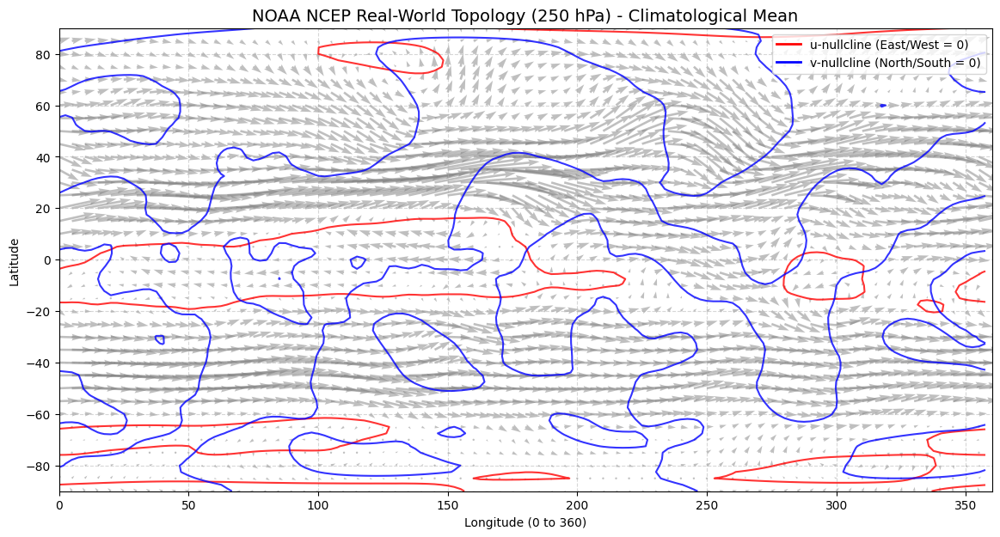

In [ ]:
import netCDF4 as nc
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# 1. NOAA PSL OPeNDAP URLs
url_u = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.mean.nc"
url_v = "http://psl.noaa.gov/thredds/dodsC/Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.mean.nc"

print("Connecting directly via netCDF4 C-library (bypassing xarray)...")

# 2. Open datasets directly
ds_u = nc.Dataset(url_u)
ds_v = nc.Dataset(url_v)

# 3. Get the exact array index for the 250 hPa pressure level
levels = ds_u.variables['level'][:]
level_idx = np.where(levels == 250.0)[0][0]

# 4. Slice the data: time 0 (January), level 250 hPa, all lats, all lons
u_real = ds_u.variables['uwnd'][0, level_idx, :, :]
v_real = ds_v.variables['vwnd'][0, level_idx, :, :]
lon_real = ds_u.variables['lon'][:]
lat_real = ds_u.variables['lat'][:]

Lon_r, Lat_r = np.meshgrid(lon_real, lat_real)

# 5. Visualization
plt.figure(figsize=(14, 7))

# Quiver plot for the raw wind vectors (subsampled for visual clarity)
skip = (slice(None, None, 2), slice(None, None, 2))
plt.quiver(Lon_r[skip], Lat_r[skip], u_real[skip], v_real[skip],
           color='gray', alpha=0.5, scale=800)

# The real-world topological anchors (Nullclines)
plt.contour(Lon_r, Lat_r, u_real, levels=[0], colors='red', linewidths=1.5, alpha=0.8)
plt.contour(Lon_r, Lat_r, v_real, levels=[0], colors='blue', linewidths=1.5, alpha=0.8)

# Formatting
plt.title('NOAA NCEP Real-World Topology (250 hPa) - Climatological Mean', fontsize=14)
plt.xlabel('Longitude (0 to 360)')
plt.ylabel('Latitude')
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.grid(True, linestyle='--', alpha=0.5)

# Custom legend
custom_lines = [Line2D([0], [0], color='red', lw=2),
                Line2D([0], [0], color='blue', lw=2)]
plt.legend(custom_lines, ['u-nullcline (East/West = 0)', 'v-nullcline (North/South = 0)'], loc='upper right')

plt.show()